In [ ]:
│  To resume this session: gemini --resume '170a0414-44df-450b-89b4-62e33baf2c8f'                                                                                                                                                    │


# Evaluate MobileNetV3 defect classifier

Loads the trained checkpoint and runs evaluation on the **same validation split** the training notebook used (SEED=42). Re-builds the manifest from the same 3 sources to get the exact same `val_df`.

Focus: where does the model confuse `paint_peeling` and `water_damage`?

**Run on Kaggle** with the same Roboflow key. The trained `.pt` should already be at `/kaggle/working/mobilenetv3_defect_4class.pt` if you train + eval in the same notebook session, or upload it as a Kaggle dataset and adjust `MODEL_PATH` below.

In [2]:
!pip install -q timm grad-cam roboflow seaborn

In [3]:
import random
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import timm
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, average_precision_score,
                             f1_score, precision_recall_curve, confusion_matrix)
import matplotlib.pyplot as plt
import seaborn as sns
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', DEVICE)

D:\Users\akbus\AppData\Local\Programs\Python\Python314\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cuda


In [4]:
# MUST match the training notebook exactly so the val split is reproduced.
CLASSES = ['crack', 'water_damage', 'paint_peeling', 'rust']
NUM_CLASSES = len(CLASSES)
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES)}
IMG_SIZE = 384
BATCH_SIZE = 32
NUM_WORKERS = 0   # 0 on Windows avoids multiprocessing pickling issues in notebooks
SEED = 42
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]
THRESHOLD = 0.5

# Local Windows paths
DATA_ROOT = Path(r'D:/Graduation project/ML2/data')
DATA_ROOT.mkdir(parents=True, exist_ok=True)

MODEL_PATH = r'D:/Graduation project/ML2/mobilenetv3_defect_4class.pt'

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

## 1. Re-download the same datasets

If you've already run them in this Kaggle session, the cells will be no-ops / fast.

In [ ]:
import os
ROBOFLOW_API_KEY = os.environ.get('ROBOFLOW_API_KEY', '')  # set in env or Kaggle secret

from roboflow import Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

if not (DATA_ROOT/'bdi'/'train').exists():
    p1 = rf.workspace('kerdawy').project('building-damage-insurance-jemsv-yndvd')
    p1.version(1).download('multiclass', location=str(DATA_ROOT/'bdi'))

if not (DATA_ROOT/'heritage'/'train').exists():
    p2 = rf.workspace('defects-dataset').project('heritage-defects-jnka8')
    p2.version(p2.versions()[0].version).download('multiclass', location=str(DATA_ROOT/'heritage'))

import subprocess
if not (DATA_ROOT/'bd3').exists():
    # Requires git on PATH. If not installed, manually clone:
    #   https://github.com/Praveenkottari/BD3-Dataset → D:/Graduation project/ML2/data/bd3
    subprocess.run(['git', 'clone', '--depth', '1',
                    'https://github.com/Praveenkottari/BD3-Dataset',
                    str(DATA_ROOT/'bd3')], check=True)

print('Datasets ready at', DATA_ROOT)

In [6]:
# Same LABEL_MAP and ingest helpers as training.
LABEL_MAP = {
    'crack': 'crack', 'major_crack': 'crack', 'minor_crack': 'crack',
    'major crack': 'crack', 'minor crack': 'crack', 'cracks': 'crack',
    'stain': 'water_damage', 'damp': 'water_damage', 'dampness': 'water_damage',
    'water_seepage': 'water_damage', 'seepage': 'water_damage',
    'efflorescence': 'water_damage', 'dampness with fungus': 'water_damage',
    'water damage': 'water_damage', 'water_damage': 'water_damage',
    'peeling': 'paint_peeling', 'peeling_paint': 'paint_peeling',
    'peeling paint': 'paint_peeling', 'paintpeel': 'paint_peeling',
    'paint_peeling': 'paint_peeling', 'flaking plaster': 'paint_peeling',
    'flaking_plaster': 'paint_peeling',
    'rust': 'rust', 'corrosion': 'rust', 'moderate corrosion': 'rust',
    'mold': None, 'mould': None, 'algae': None, 'fungus': None,
    'no_defect': None, 'normal': None,
}

def normalize(name):
    return name.strip().lower().replace('-', '_')

def empty_row(path):
    return {'path': str(path), **{c: 0 for c in CLASSES}}

def ingest_roboflow_multilabel(root):
    rows = []
    for split in ['train', 'valid', 'test']:
        csv_path = Path(root) / split / '_classes.csv'
        if not csv_path.exists():
            continue
        df = pd.read_csv(csv_path)
        df.columns = [c.strip() for c in df.columns]
        cols = [c for c in df.columns if c.lower() != 'filename']
        for _, r in df.iterrows():
            img_path = Path(root) / split / r['filename']
            if not img_path.exists():
                continue
            row = empty_row(img_path)
            for c in cols:
                if int(r[c]) == 1:
                    mapped = LABEL_MAP.get(normalize(c))
                    if mapped:
                        row[mapped] = 1
            if any(row[c] for c in CLASSES):
                rows.append(row)
    return rows

def ingest_folder_per_class(root):
    rows = []
    root = Path(root)
    for cls_dir in root.glob('**/'):
        if not cls_dir.is_dir():
            continue
        mapped = LABEL_MAP.get(normalize(cls_dir.name))
        if not mapped:
            continue
        for img in cls_dir.glob('*'):
            if img.suffix.lower() in {'.jpg', '.jpeg', '.png'}:
                row = empty_row(img)
                row[mapped] = 1
                rows.append(row)
    return rows

all_rows = []
all_rows += ingest_roboflow_multilabel(DATA_ROOT/'bdi')
all_rows += ingest_roboflow_multilabel(DATA_ROOT/'heritage')
all_rows += ingest_folder_per_class(DATA_ROOT/'bd3')

manifest = pd.DataFrame(all_rows).drop_duplicates(subset='path').reset_index(drop=True)
print('Total images:', len(manifest))
print(manifest[CLASSES].sum())

Total images: 7791
crack            3348
water_damage     2659
paint_peeling    1230
rust              832
dtype: int64


In [7]:
# Same split as training.
train_df, val_df = train_test_split(manifest, test_size=0.15, random_state=SEED)
val_df = val_df.reset_index(drop=True)
print(f'val={len(val_df)}')
print('Per-class positives in val:')
print(val_df[CLASSES].sum())

val=1169
Per-class positives in val:
crack            510
water_damage     387
paint_peeling    178
rust             131
dtype: int64


In [8]:
val_tf = transforms.Compose([
    transforms.Resize(IMG_SIZE + 32),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

class DefectDataset(Dataset):
    def __init__(self, df, tf):
        self.df = df.reset_index(drop=True)
        self.tf = tf
    def __len__(self):
        return len(self.df)
    def __getitem__(self, i):
        r = self.df.iloc[i]
        img = Image.open(r['path']).convert('RGB')
        x = self.tf(img)
        y = torch.tensor([r[c] for c in CLASSES], dtype=torch.float32)
        return x, y

val_ds = DefectDataset(val_df, val_tf)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

## 2. Load the trained model

In [9]:
ckpt = torch.load(MODEL_PATH, map_location=DEVICE)
print('classes in ckpt:', ckpt.get('classes'))

model = timm.create_model('mobilenetv3_large_100', pretrained=False,
                          num_classes=NUM_CLASSES).to(DEVICE)

state_dict = ckpt['state_dict']
if list(state_dict.keys())[0].startswith('module.'):
    state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
model.load_state_dict(state_dict)
model.eval();

classes in ckpt: ['crack', 'water_damage', 'paint_peeling', 'rust']


## 3. Inference on the val set

In [10]:
all_probs, all_labels = [], []
with torch.no_grad():
    for x, y in val_loader:
        x = x.to(DEVICE, non_blocking=True)
        probs = torch.sigmoid(model(x)).cpu().numpy()
        all_probs.append(probs)
        all_labels.append(y.numpy())
all_probs = np.concatenate(all_probs)
all_labels = np.concatenate(all_labels).astype(int)
all_paths = val_df['path'].values
preds = (all_probs > THRESHOLD).astype(int)
print('probs:', all_probs.shape, 'labels:', all_labels.shape)

probs: (1169, 4) labels: (1169, 4)


## 4. Per-class metrics

In [11]:
print(classification_report(all_labels, preds, target_names=CLASSES, zero_division=0))
print('Average Precision (per class):')
for i, c in enumerate(CLASSES):
    if all_labels[:, i].sum() > 0:
        ap = average_precision_score(all_labels[:, i], all_probs[:, i])
        print(f'  {c:14s} AP={ap:.3f}')
print(f"macro-F1 @ {THRESHOLD}: {f1_score(all_labels, preds, average='macro', zero_division=0):.3f}")

               precision    recall  f1-score   support

        crack       0.98      0.98      0.98       510
 water_damage       0.98      0.99      0.98       387
paint_peeling       0.94      0.98      0.96       178
         rust       0.99      0.99      0.99       131

    micro avg       0.98      0.98      0.98      1206
    macro avg       0.97      0.98      0.98      1206
 weighted avg       0.98      0.98      0.98      1206
  samples avg       0.98      0.99      0.98      1206

Average Precision (per class):
  crack          AP=0.999
  water_damage   AP=0.997
  paint_peeling  AP=0.989
  rust           AP=0.994
macro-F1 @ 0.5: 0.979


## 5. Confusion analysis

Two views:
- **Co-occurrence**: rows = GT class, cols = predicted class. Each cell counts samples where GT has the row class AND the model fired for the column class. Diagonal = correct fires; off-diagonal = co-prediction or confusion (multi-label, so totals don't sum to N).
- **Single-label confusion matrix**: filtered to images with exactly one GT class, using top-1 prediction. Cleaner read for "X gets called Y".

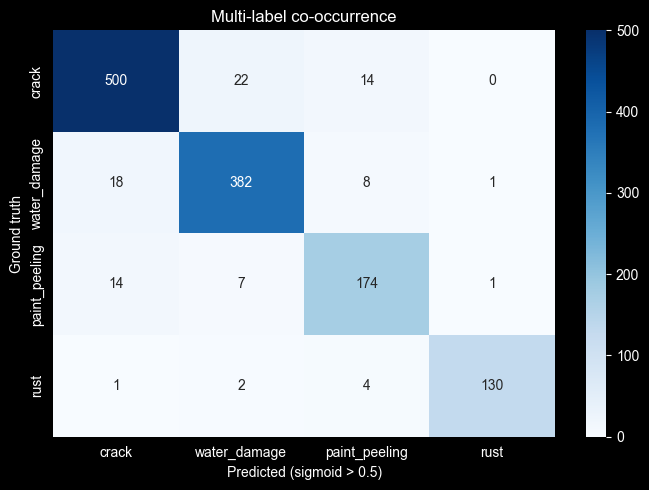

In [12]:
co = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=int)
for gt_i in range(NUM_CLASSES):
    for pr_i in range(NUM_CLASSES):
        co[gt_i, pr_i] = ((all_labels[:, gt_i] == 1) & (preds[:, pr_i] == 1)).sum()

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(co, annot=True, fmt='d', xticklabels=CLASSES, yticklabels=CLASSES,
            cmap='Blues', ax=ax)
ax.set_xlabel('Predicted (sigmoid > 0.5)')
ax.set_ylabel('Ground truth')
ax.set_title('Multi-label co-occurrence')
plt.tight_layout(); plt.show()

Single-label samples: 1132 / 1169


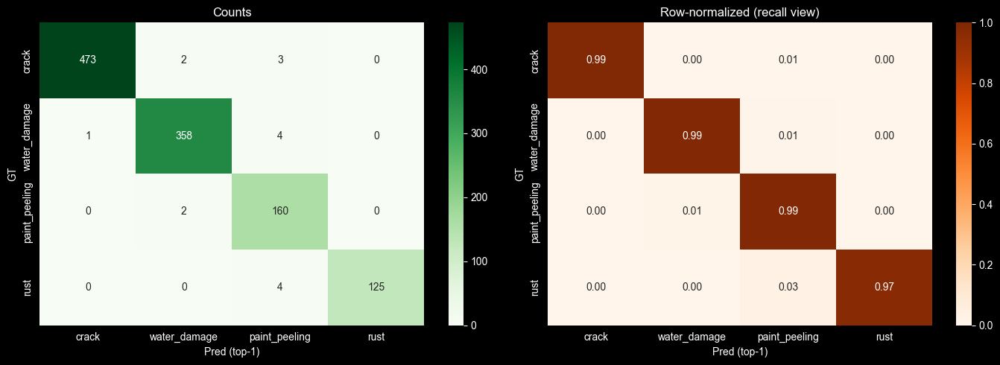

In [13]:
single_mask = all_labels.sum(axis=1) == 1
print(f'Single-label samples: {single_mask.sum()} / {len(all_labels)}')
if single_mask.sum() > 0:
    gt_class = np.argmax(all_labels[single_mask], axis=1)
    pr_class = np.argmax(all_probs[single_mask], axis=1)
    cm = confusion_matrix(gt_class, pr_class, labels=list(range(NUM_CLASSES)))
    cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASSES, yticklabels=CLASSES,
                cmap='Greens', ax=axes[0])
    axes[0].set_title('Counts'); axes[0].set_xlabel('Pred (top-1)'); axes[0].set_ylabel('GT')
    sns.heatmap(cm_norm, annot=True, fmt='.2f', xticklabels=CLASSES, yticklabels=CLASSES,
                cmap='Oranges', ax=axes[1], vmin=0, vmax=1)
    axes[1].set_title('Row-normalized (recall view)')
    axes[1].set_xlabel('Pred (top-1)'); axes[1].set_ylabel('GT')
    plt.tight_layout(); plt.show()

## 6. Misclassification gallery — `paint_peeling` ↔ `water_damage`

Two failure modes the user suspects:
1. Model fires `water_damage` on images whose GT is `paint_peeling` only.
2. Model misses `paint_peeling` and fires `water_damage` instead.

water_damage fired on paint_peeling-only images: 3
paint_peeling missed, water_damage predicted:     3


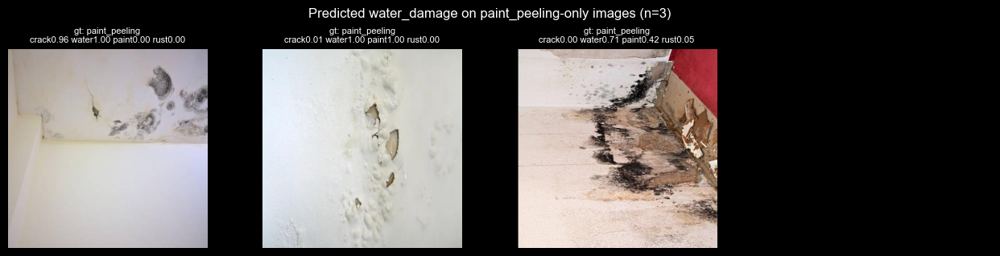

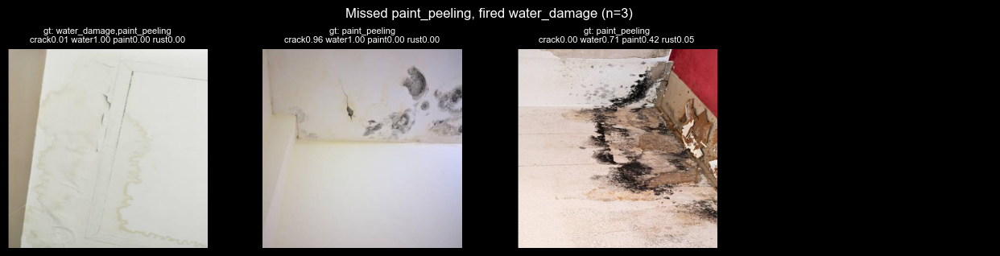

In [14]:
PAINT = CLASSES.index('paint_peeling')
WATER = CLASSES.index('water_damage')

# Mode 1: water_damage = predicted, but GT had paint_peeling and NOT water_damage.
mask_water_on_paint = (preds[:, WATER] == 1) & (all_labels[:, WATER] == 0) & (all_labels[:, PAINT] == 1)
# Mode 2: paint_peeling missed (FN), water_damage fired instead.
mask_miss_paint = (preds[:, PAINT] == 0) & (all_labels[:, PAINT] == 1) & (preds[:, WATER] == 1)

print('water_damage fired on paint_peeling-only images:', mask_water_on_paint.sum())
print('paint_peeling missed, water_damage predicted:    ', mask_miss_paint.sum())

def show_gallery(mask, title, sort_by_idx, n=8):
    idx = np.where(mask)[0]
    if len(idx) == 0:
        print(f'{title}: 0 examples'); return
    idx = idx[np.argsort(-all_probs[idx, sort_by_idx])][:n]
    cols = 4
    rows = (len(idx) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols*3.2, rows*3.2))
    axes = np.array(axes).reshape(-1)
    for ax in axes:
        ax.axis('off')
    for ax, i in zip(axes, idx):
        ax.imshow(Image.open(all_paths[i]).convert('RGB'))
        gt = ','.join(c for j, c in enumerate(CLASSES) if all_labels[i, j])
        pr = ' '.join(f'{c[:5]}{all_probs[i,j]:.2f}' for j, c in enumerate(CLASSES))
        ax.set_title(f'gt: {gt}\n{pr}', fontsize=8)
    fig.suptitle(title); plt.tight_layout(); plt.show()

show_gallery(mask_water_on_paint,
             f'Predicted water_damage on paint_peeling-only images (n={mask_water_on_paint.sum()})',
             sort_by_idx=WATER)
show_gallery(mask_miss_paint,
             f'Missed paint_peeling, fired water_damage (n={mask_miss_paint.sum()})',
             sort_by_idx=WATER)

## 7. Grad-CAM on the confused examples

For each confused image: show input, CAM for the **wrong** class (water_damage), CAM for the **right** class (paint_peeling). If the wrong-class CAM hits the same paint flakes the right-class CAM does, the model is genuinely conflating the visual features.

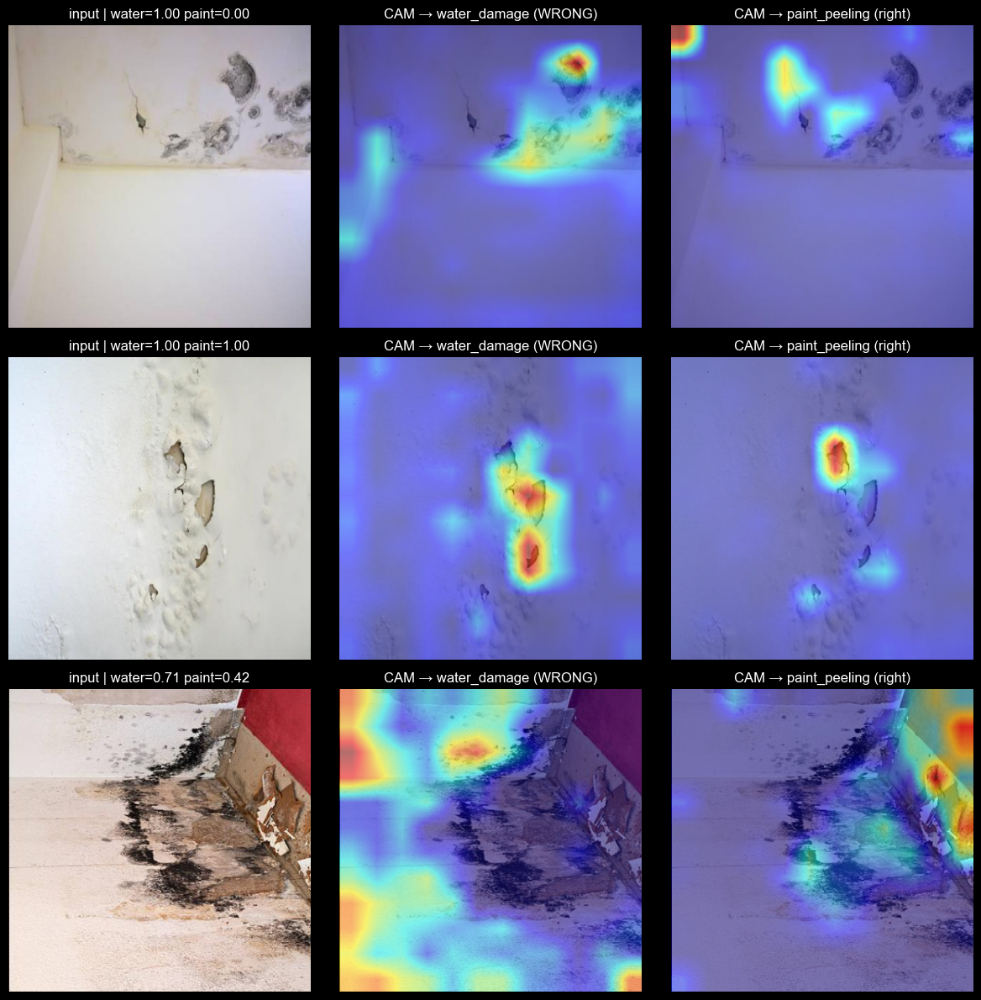

In [15]:
target_layer = [model.blocks[-1]]
cam = GradCAM(model=model, target_layers=target_layer)

idx = np.where(mask_water_on_paint)[0]
idx = idx[np.argsort(-all_probs[idx, WATER])][:4]  # top-4 worst

if len(idx) == 0:
    print('No examples to visualize.')
else:
    fig, axes = plt.subplots(len(idx), 3, figsize=(12, 4*len(idx)))
    if len(idx) == 1:
        axes = axes.reshape(1, -1)
    for ax_row, i in zip(axes, idx):
        img = Image.open(all_paths[i]).convert('RGB')
        x = val_tf(img).unsqueeze(0).to(DEVICE)
        rgb = np.array(img.resize((IMG_SIZE, IMG_SIZE))).astype(np.float32) / 255.0
        heat_w = cam(input_tensor=x, targets=[ClassifierOutputTarget(WATER)])[0]
        heat_p = cam(input_tensor=x, targets=[ClassifierOutputTarget(PAINT)])[0]
        ax_row[0].imshow(rgb); ax_row[0].axis('off')
        ax_row[0].set_title(f'input | water={all_probs[i,WATER]:.2f} paint={all_probs[i,PAINT]:.2f}')
        ax_row[1].imshow(show_cam_on_image(rgb, heat_w, use_rgb=True))
        ax_row[1].set_title('CAM → water_damage (WRONG)'); ax_row[1].axis('off')
        ax_row[2].imshow(show_cam_on_image(rgb, heat_p, use_rgb=True))
        ax_row[2].set_title('CAM → paint_peeling (right)'); ax_row[2].axis('off')
    plt.tight_layout(); plt.show()

## 8. Per-class threshold sweep

If `water_damage` is over-firing, its optimal threshold may be higher than 0.5. The numbers below show the F1-optimal threshold per class — you can use them in `predict_routes.py` instead of the global 0.5.

In [16]:
print(f'{"class":15s} {"best_t":>7s} {"F1":>6s} {"P":>6s} {"R":>6s}')
for i, c in enumerate(CLASSES):
    if all_labels[:, i].sum() == 0:
        print(f'{c:15s} (no positives)'); continue
    p, r, t = precision_recall_curve(all_labels[:, i], all_probs[:, i])
    f1s = 2*p*r / np.clip(p+r, 1e-9, None)
    best = int(np.nanargmax(f1s))
    bt = t[max(0, best-1)] if best > 0 else 0.0
    print(f'{c:15s} {bt:7.2f} {f1s[best]:6.3f} {p[best]:6.3f} {r[best]:6.3f}')

class            best_t     F1      P      R
crack              0.24  0.985  0.979  0.992
water_damage       0.47  0.983  0.977  0.990
paint_peeling      0.87  0.967  0.956  0.978
rust               0.48  0.992  0.992  0.992


## 9. Real-world image test — `damage_images/`

Single-label folders (`crack`, `paint_peeling`, `rust`, `water_damage`): GT = folder name.  
`multi/` folder: no GT, shown with Grad-CAM for visual inspection.

Run only cells 1–3 + cell 8 (load model) before this if you want to run this section standalone.

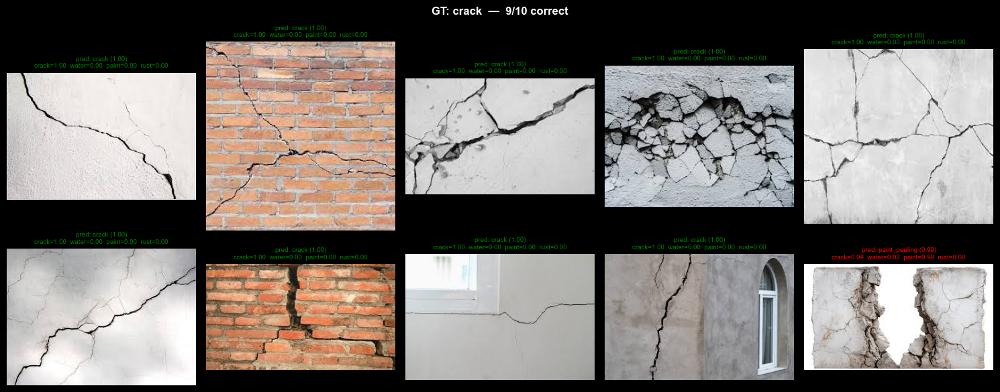

crack: 9/10 correct



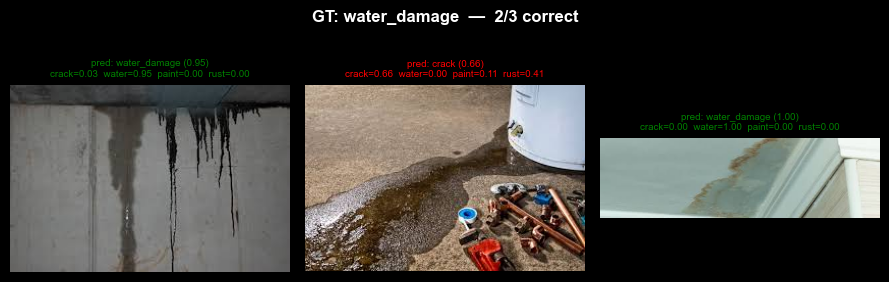

water_damage: 2/3 correct



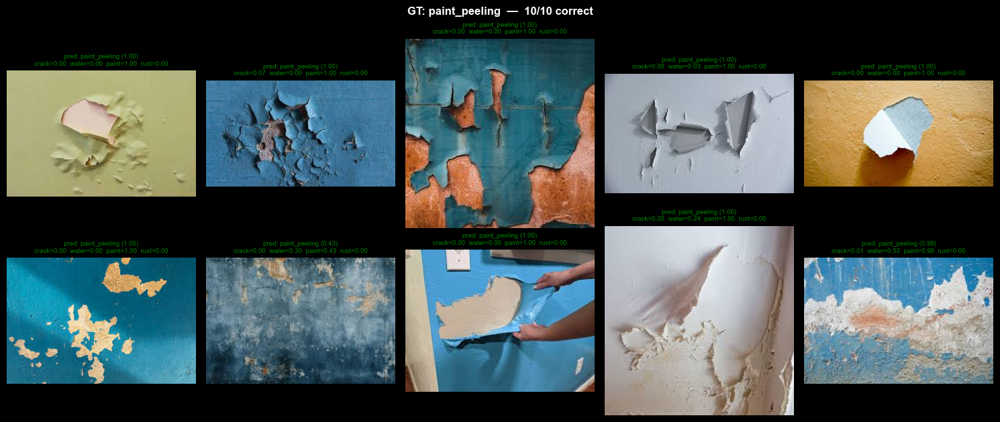

paint_peeling: 10/10 correct



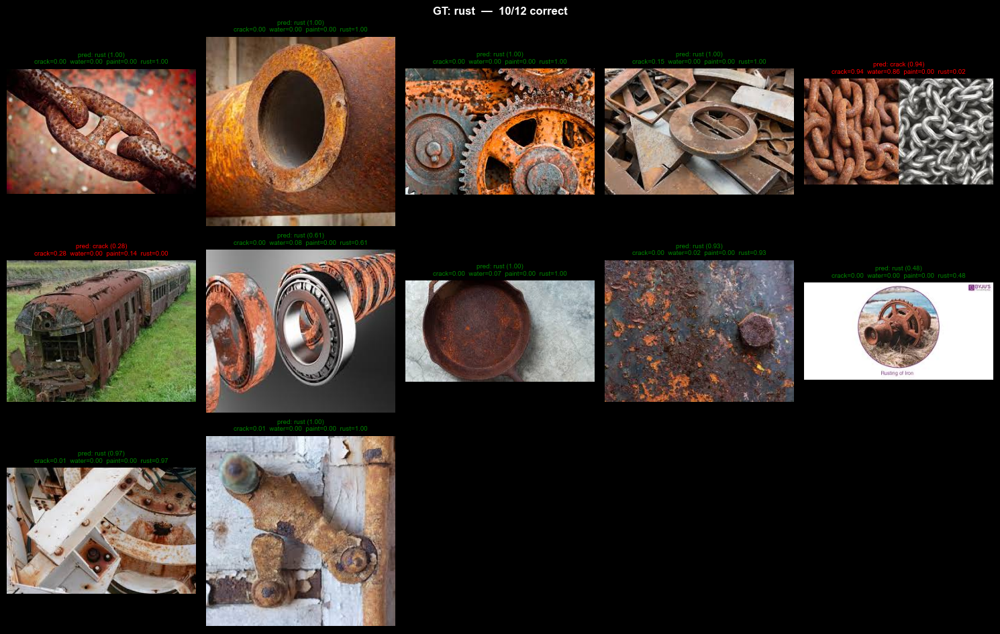

rust: 10/12 correct



In [17]:
REALWORLD_ROOT = Path(r'D:/Graduation project/ML2/damage_images')
SINGLE_LABEL_FOLDERS = ['crack', 'water_damage', 'paint_peeling', 'rust']

def predict_image(path):
    img = Image.open(path).convert('RGB')
    x = val_tf(img).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        probs = torch.sigmoid(model(x))[0].cpu().numpy()
    return img, probs

def prob_str(probs):
    return '  '.join(f'{c[:5]}={probs[j]:.2f}' for j, c in enumerate(CLASSES))

# ── Single-label folders ─────────────────────────────────────────────────────
for folder in SINGLE_LABEL_FOLDERS:
    folder_path = REALWORLD_ROOT / folder
    if not folder_path.exists():
        continue
    imgs = sorted(folder_path.glob('*'))
    imgs = [p for p in imgs if p.suffix.lower() in {'.jpg', '.jpeg', '.png'}]
    if not imgs:
        continue

    correct = 0
    cols = min(5, len(imgs))
    rows = (len(imgs) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.2))
    axes = np.array(axes).reshape(-1)
    for ax in axes:
        ax.axis('off')

    for ax, path in zip(axes, imgs):
        img, probs = predict_image(path)
        top = int(np.argmax(probs))
        hit = CLASSES[top] == folder
        correct += hit
        color = 'green' if hit else 'red'
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f'pred: {CLASSES[top]} ({probs[top]:.2f})\n{prob_str(probs)}',
                     fontsize=7, color=color)

    fig.suptitle(f'GT: {folder}  —  {correct}/{len(imgs)} correct', fontweight='bold')
    plt.tight_layout()
    plt.show()
    print(f'{folder}: {correct}/{len(imgs)} correct\n')

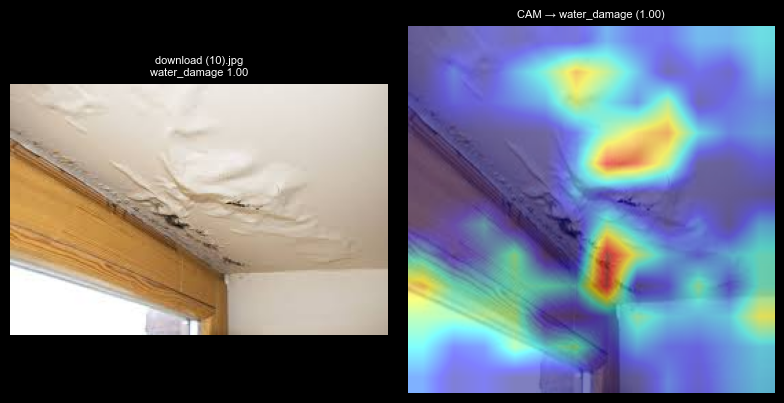

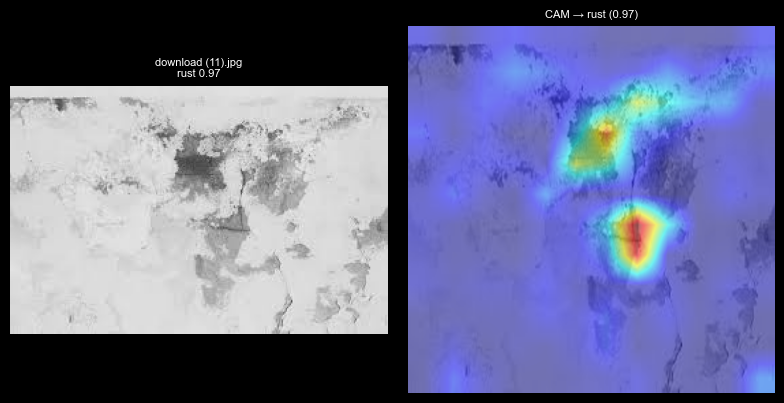

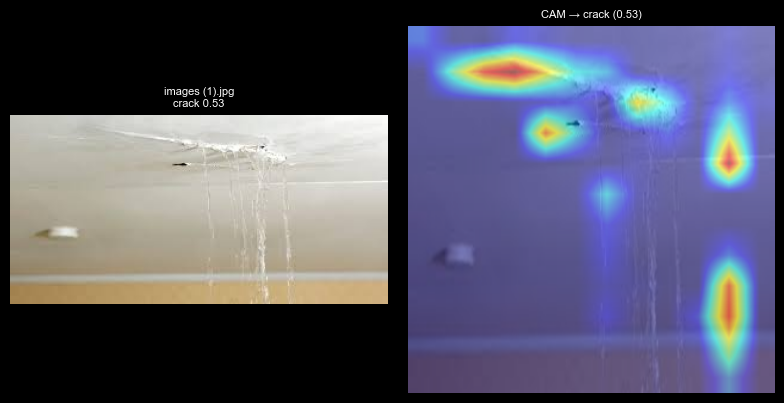

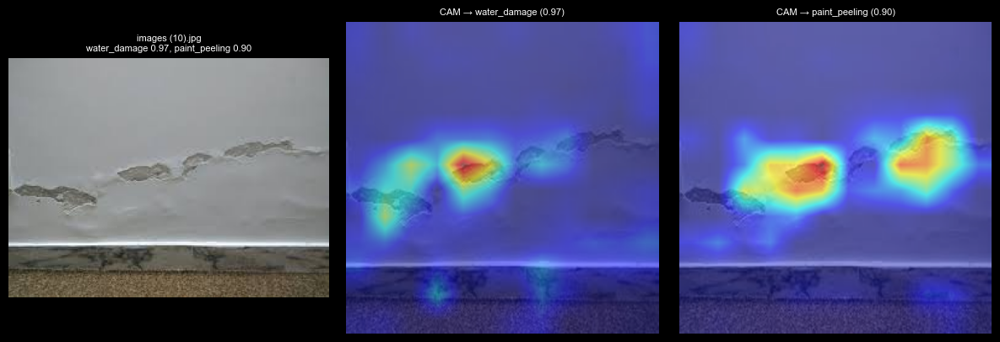

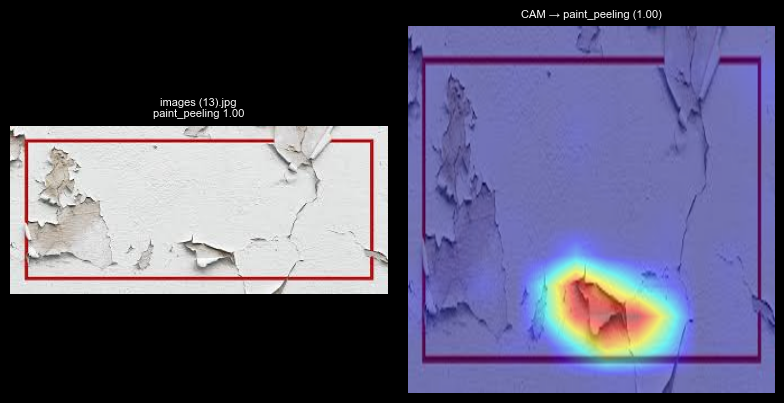

...

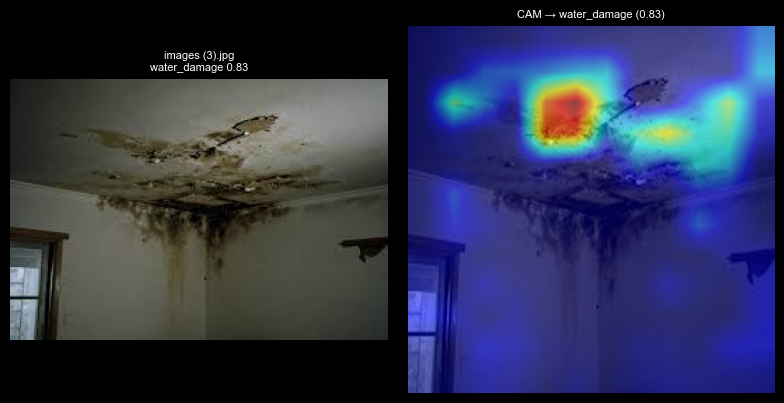

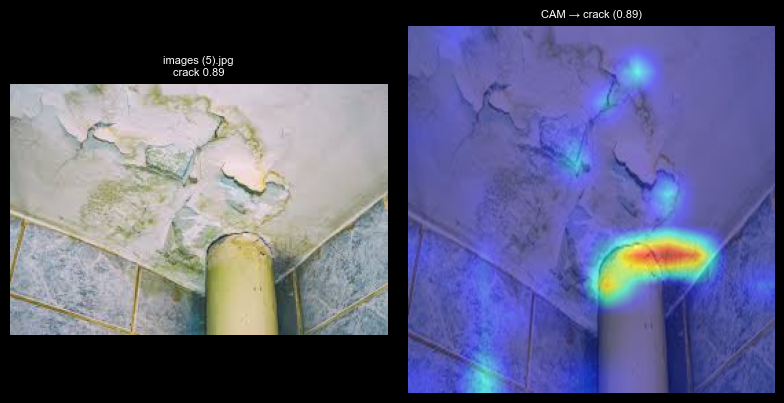

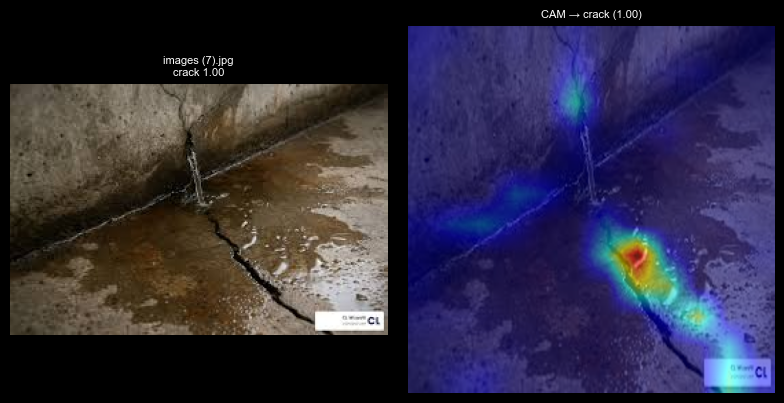

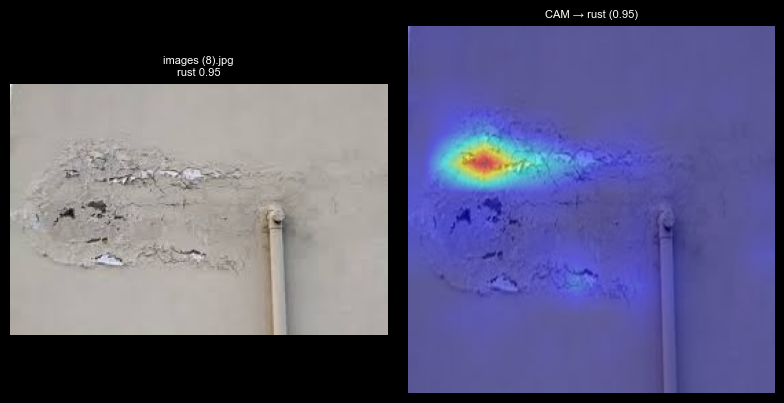

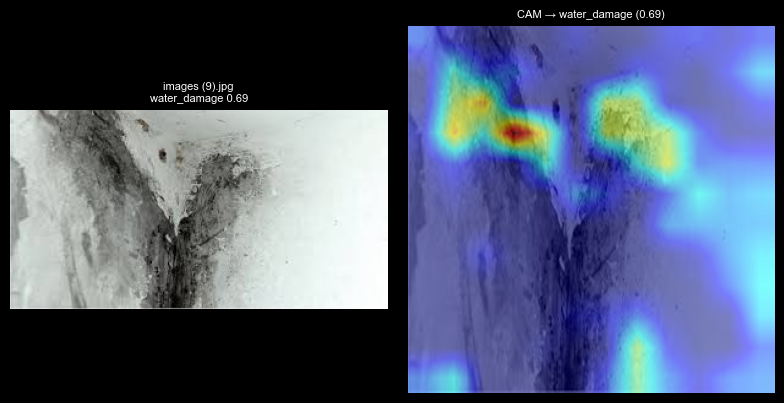

In [18]:
# ── Multi-label folder — no GT, show all predictions + Grad-CAM ──────────────
multi_path = REALWORLD_ROOT / 'multi'
imgs = sorted(multi_path.glob('*'))
imgs = [p for p in imgs if p.suffix.lower() in {'.jpg', '.jpeg', '.png'}]

target_layer = [model.blocks[-1]]
cam = GradCAM(model=model, target_layers=target_layer)

for path in imgs:
    img, probs = predict_image(path)
    fired = [c for j, c in enumerate(CLASSES) if probs[j] > THRESHOLD]
    top = int(np.argmax(probs))

    x = val_tf(img).unsqueeze(0).to(DEVICE)
    rgb = np.array(img.resize((IMG_SIZE, IMG_SIZE))).astype(np.float32) / 255.0

    # Grad-CAM for every class that fired (or just top-1 if nothing > threshold)
    targets = fired if fired else [CLASSES[top]]
    n = len(targets)
    fig, axes = plt.subplots(1, n + 1, figsize=((n + 1) * 4, 4))
    axes[0].imshow(img); axes[0].axis('off')
    label = ', '.join(f'{c} {probs[CLASSES.index(c)]:.2f}' for c in targets) or f'{CLASSES[top]} {probs[top]:.2f} (below thresh)'
    axes[0].set_title(f'{path.name}\n{label}', fontsize=8)

    for ax, cls_name in zip(axes[1:], targets):
        cls_idx = CLASSES.index(cls_name)
        heat = cam(input_tensor=x, targets=[ClassifierOutputTarget(cls_idx)])[0]
        ax.imshow(show_cam_on_image(rgb, heat, use_rgb=True))
        ax.axis('off')
        ax.set_title(f'CAM → {cls_name} ({probs[cls_idx]:.2f})', fontsize=8)

    plt.tight_layout()
    plt.show()